# MISSING MIGRANTS 

In this notebook, I will be exploring and visualising data about migrants who have died or have gone missing along migration routes worldwide. The source of the dataset is "IOM's Missing Migrants Project" . Please visit their website for more information [here](https://missingmigrants.iom.int/).
    

The 'Missing Migrants' dataset records the details of the incidents where migrants (commonly asylum-seekers and refugees) have died or gone missing from January 2014 to December 2019. The data only gives minimum estimates for the number of people affected, and the end of many of these human lives go unrecorded. 

Before creating graphs, I handled the missing values in the columns that I wanted to work with. Then I created a Folium Marker map of incidents and a HeatMap, used Seaborn graphs to visualise data, and used regular expressions to find and extract strings to create a WordCloud.

Please visit this [Amnesty International link](https://www.amnesty.org/en/what-we-do/refugees-asylum-seekers-and-migrants/) for information on how migrants, asylum seekers and refugees are defined. 



In [3]:
import numpy as np 
import pandas as pd 

In [4]:
#reading in csv file and changing dtype of 'Reported Date column to datetime'
mm_data = pd.read_csv('MissingMigrants-Global-2019-12-31_correct.csv', parse_dates = ['Reported Date'])

## 1. About the dataset 

In [5]:
#dataset information
mm_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5987 entries, 0 to 5986
Data columns (total 20 columns):
Web ID                                 5987 non-null int64
Region of Incident                     5987 non-null object
Reported Date                          5987 non-null datetime64[ns]
Reported Year                          5987 non-null int64
Reported Month                         5987 non-null object
Number Dead                            5762 non-null float64
Minimum Estimated Number of Missing    576 non-null float64
Total Dead and Missing                 5987 non-null int64
Number of Survivors                    914 non-null float64
Number of Females                      1058 non-null float64
Number of Males                        3286 non-null float64
Number of Children                     753 non-null float64
Cause of Death                         5987 non-null object
Location Description                   5977 non-null object
Information Source                     5985 n

In the Missing Migrants dataset, there are 5987 entries and 20 columns. The columns cover the date and location of the incident, the demographic of the migrants involved, the cause and number of deaths, the number of missing migrants as a result of the incident, the number of survivors, links to news sources regarding the incident and the quality of the news sources.

In [6]:
#time period covered in data set
print('The Missing Migrants dataset covers the period {0} to {1}'.format(str(mm_data['Reported Date'][5986]), str(mm_data['Reported Date'][0])))

The Missing Migrants dataset covers the period 2014-01-06 00:00:00 to 2019-12-30 00:00:00


**Questions to explore:**
1. **In which region  did the greatest number of reported incidents occur and in which region did the least number of reported incidents occur?**
2. **What were the biggest causes of death?**
3. **Are there any seasonal patterns?**

Before delving into these questions, we must  explore the missing values in the dataset. For our purposes, we will only need the columns **'Region of Incident', 'Reported Date', 'Reported Year', 'Reported Month', 'Number Dead', 'Minimum Estimated Number of Missing', 'Total Dead and Missing', 'Cause of Death', **and** 'Location Coordinates'** (for mapping). So we will examine the NaN values where they exist for these columns only.

## 2. Handling missing data

In [7]:
#missing values
mm_data.isnull().sum().sort_values(ascending=False)

Minimum Estimated Number of Missing    5411
Number of Children                     5234
Number of Survivors                    5073
Number of Females                      4929
Migration Route                        3056
Number of Males                        2701
URL                                    2177
Number Dead                             225
UNSD Geographical Grouping               46
Location Description                     10
Information Source                        2
Location Coordinates                      1
Reported Year                             0
Region of Incident                        0
Reported Date                             0
Source Quality                            0
Reported Month                            0
Total Dead and Missing                    0
Cause of Death                            0
Web ID                                    0
dtype: int64

### Examining the NaN values of the 'Number Dead' column:

In [8]:
#extracting only the rows where 'Number Dead' is null
null_number_dead = mm_data[mm_data['Number Dead'].isnull()]
print('There are {} missing values in the "Number Dead" column.'.format(null_number_dead.shape[0]))

There are 225 missing values in the "Number Dead" column.


There are 255 entries where 'Number Dead' is NaN.

In [9]:
null_number_dead.head()

,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
29,52633,Mediterranean,2019-11-28,2019,Nov,NaN,3.0,3,NaN,NaN,NaN,NaN,Presumed drowning,Unspecified location off the coast of Libya (r...,IOM Libya,"32.906561900000, 13.258396700000",Central Mediterranean,NaN,Uncategorized,4
31,52635,Mediterranean,2019-11-26,2019,Nov,NaN,73.0,73,NaN,20.0,NaN,3.0,Presumed drowning,"Unknown location in the Alboran Sea, between M...","Caminando Fronteras, Nuovi Desaparecidos","36.214401400000, -3.419552700000",Western Mediterranean,"http://bit.ly/380y8Uz, http://bit.ly/2OEuFnc, ...",Uncategorized,4
35,52626,Mediterranean,2019-11-23,2019,Nov,NaN,13.0,13,47.0,NaN,NaN,NaN,Drowning,"Unspecified location off the coast of Zuwara, ...",IOM Libya,"32.940037500000, 12.082105100000",Central Mediterranean,NaN,Uncategorized,4
43,52620,Caribbean,2019-11-18,2019,Nov,NaN,3.0,3,13.0,NaN,3.0,NaN,Presumed drowning,"Unspecified location in the Mona Passage, off ...",US Coast Guard,"18.201345200000, -67.145154900000",NaN,https://bit.ly/2O99Pft,Caribbean,5
52,52604,Europe,2019-11-11,2019,Nov,NaN,4.0,4,6.0,NaN,NaN,NaN,Drowning,"Danube river, near Apatin, Serbia - on border ...","ANSA, EFE","46.308380700000, 18.929394000000",NaN,"http://bit.ly/2CD91Jg, http://bit.ly/33DSQHf",Southern Europe,3


Checking the information sources associated with the first few entries in null_number_dead indicates that the 'Number Dead' value is null because no one repotedly died in that incident.  This is supported by a cursory glance at the first 5 entries which show that the 'Minimum Estimated Number of Missing' value is the same as the 'Total Dead and Missing' value. If this holds out for all entries in null_number_dead, then we can input 0 for the NaN 'Number Dead' values. Does this hold true for all the entries in null_number_dead? 

In [10]:
#boolean mask to filter entries where number missing is not equal to total number dead and missing
bool_null_number_dead = null_number_dead[null_number_dead['Minimum Estimated Number of Missing'] != null_number_dead['Total Dead and Missing']]

In [11]:
bool_null_number_dead

,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
3139,31060,Mediterranean,2017-06-17,2017,Jun,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,"Off the coast of Sabratha, Libya",UNHCR,"32.862293600000, 12.530664000000",Central Mediterranean,NaN,Uncategorized,4
3140,31061,Mediterranean,2017-06-17,2017,Jun,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,"Off the coast of Sabratha, Libya",UNHCR,"32.862293600000, 12.530664000000",Central Mediterranean,NaN,Uncategorized,4
3989,42715,Central America,2016-10-04,2016,Oct,NaN,NaN,0,NaN,NaN,NaN,NaN,"Dehydration, Asphyxiation","Back of a truck, Novara, Tres Valles, Veracruz...",La Journada,"18.268156600000, -95.896946100000",Central America to US,http://bit.ly/2ds5sdg,Central America,1
4226,42846,Central America,2016-07-20,2016,Jul,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,"Pacific Ocean; Left in boat from San Jose, Chi...",La Tribuna,"18.268156600000, -95.896946100000",Central America to US,http://bit.ly/2u8T36K,Central America,1
4447,42965,Mediterranean,2016-05-25,2016,May,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,"Off the coast of Zawiya, Libya",UNHCR,"32.761023100000, 12.699894300000",Central Mediterranean,NaN,Uncategorized,4
4650,42959,Mediterranean,2016-03-19,2016,Mar,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,NaN,IOM Italy,"33.058823123634, 17.165613325000",Central Mediterranean,NaN,Uncategorized,4
5253,40421,Mediterranean,2015-10-10,2015,Oct,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,off the Egyptian port of Baltim,"IOM and Daily Star, AFP report","31.593450985205, 31.089763608984",Central Mediterranean,http://bit.ly/1MmKSlc,Uncategorized,4
5568,40298,North Africa,2015-06-03,2015,Jun,NaN,NaN,0,NaN,NaN,NaN,NaN,Dehydration,Between Arlit in Niger and Algeria. 67 and 70 ...,IOM Niger,"20.145079000000, 7.404254000000",NaN,NaN,Northern Africa,4
5569,40300,North Africa,2015-06-03,2015,Jun,NaN,NaN,0,NaN,NaN,NaN,NaN,Dehydration,Between Arlit in Niger and Algeria. 67 and 70 ...,IOM Niger,"19.387730500000, 5.714761600000",NaN,NaN,Northern Africa,4
5667,40860,Central America,2015-03-17,2015,Mar,NaN,NaN,0,NaN,NaN,NaN,NaN,Train Accident,"Tabasco state, Mexico",South China Morning Post,"17.947712200000, -93.680033900000",Central America to US,http://bit.ly/1CqQVWX,Central America,1


The 10 entries where the number of missing do not equal the total number dead and missing are entries with missing data for all the columns showing number of people affected. Some entries have URLs and these news sources mention the number dead or missing in the incident. We can use these sources to fill in the NaN values in the main dataset, mm_data.

So, before we replace NaN values with 0, we will use news sources to fill in the missing data in those entries in the main data set where possible. To begin, we will extract the rows where 'Number Dead', 'Minimum Estimated Number of Missing', and 'Number of Survivors' have missing data (ie NaN).

In [12]:
#extracting the rows where 'Number Dead', 'Minimum Estimated Number of Missing', and 'Number of Survivors' have missing data (ie NaN).
missing_data = mm_data[mm_data['Number Dead'].isnull() & mm_data['Minimum Estimated Number of Missing'].isnull() & mm_data['Number of Survivors'].isnull()]

In [13]:
missing_data

,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
3139,31060,Mediterranean,2017-06-17,2017,Jun,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,"Off the coast of Sabratha, Libya",UNHCR,"32.862293600000, 12.530664000000",Central Mediterranean,NaN,Uncategorized,4
3140,31061,Mediterranean,2017-06-17,2017,Jun,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,"Off the coast of Sabratha, Libya",UNHCR,"32.862293600000, 12.530664000000",Central Mediterranean,NaN,Uncategorized,4
3989,42715,Central America,2016-10-04,2016,Oct,NaN,NaN,0,NaN,NaN,NaN,NaN,"Dehydration, Asphyxiation","Back of a truck, Novara, Tres Valles, Veracruz...",La Journada,"18.268156600000, -95.896946100000",Central America to US,http://bit.ly/2ds5sdg,Central America,1
4226,42846,Central America,2016-07-20,2016,Jul,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,"Pacific Ocean; Left in boat from San Jose, Chi...",La Tribuna,"18.268156600000, -95.896946100000",Central America to US,http://bit.ly/2u8T36K,Central America,1
4447,42965,Mediterranean,2016-05-25,2016,May,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,"Off the coast of Zawiya, Libya",UNHCR,"32.761023100000, 12.699894300000",Central Mediterranean,NaN,Uncategorized,4
4650,42959,Mediterranean,2016-03-19,2016,Mar,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,NaN,IOM Italy,"33.058823123634, 17.165613325000",Central Mediterranean,NaN,Uncategorized,4
5253,40421,Mediterranean,2015-10-10,2015,Oct,NaN,NaN,0,NaN,NaN,NaN,NaN,Drowning,off the Egyptian port of Baltim,"IOM and Daily Star, AFP report","31.593450985205, 31.089763608984",Central Mediterranean,http://bit.ly/1MmKSlc,Uncategorized,4
5568,40298,North Africa,2015-06-03,2015,Jun,NaN,NaN,0,NaN,NaN,NaN,NaN,Dehydration,Between Arlit in Niger and Algeria. 67 and 70 ...,IOM Niger,"20.145079000000, 7.404254000000",NaN,NaN,Northern Africa,4
5569,40300,North Africa,2015-06-03,2015,Jun,NaN,NaN,0,NaN,NaN,NaN,NaN,Dehydration,Between Arlit in Niger and Algeria. 67 and 70 ...,IOM Niger,"19.387730500000, 5.714761600000",NaN,NaN,Northern Africa,4
5667,40860,Central America,2015-03-17,2015,Mar,NaN,NaN,0,NaN,NaN,NaN,NaN,Train Accident,"Tabasco state, Mexico",South China Morning Post,"17.947712200000, -93.680033900000",Central America to US,http://bit.ly/1CqQVWX,Central America,1


These are the same 10 entries which we saw above with bool_null_number_dead. We will now fill in the missing data where possible using the accompanying URLs. 

In [14]:
#row 4226
mm_data.loc[4226, 'Number Dead'] = 3
mm_data.loc[4226, 'Total Dead and Missing'] = 3
#row 5253
mm_data.loc[5253, 'Number Dead' ] = 11
mm_data.loc[5253, 'Number of Survivors'] = 15
mm_data.loc[5253, 'Total Dead and Missing'] = 11
#row 5337
mm_data.loc[5667, 'Number Dead'] = 6
mm_data.loc[5667, 'Total Dead and Missing'] = 6


Do we drop the 7 remaining entries with missing data involving the number of people affected? Since we will be examining the cause of death statistic, and these entries all report the cause of death, we will not drop these entries. Additionally, as we are changing the NaN values in the dead and missing columns to 0, the values for these columns will not affect the results of the kind of analysis which we will be doing.


Now, we will input 0 in place of NaN in the 'Number Dead' column in the main dataset.

In [15]:
#replacing NaN with 0 in 'Number Dead' column
mm_data['Number Dead'].fillna(0, inplace=True)

### Examining the NaN values of the 'Minimum Estimated Number of Missing' column:

In [16]:
#extracting only those entries where 'Minimum Estimated Number of Missing' is NaN
null_missing = mm_data[mm_data['Minimum Estimated Number of Missing'].isnull()]
print('There are {} missing values in the "Minimum Estimated Number of Missing" column.'.format(null_missing.shape[0]))

There are 5411 missing values in the "Minimum Estimated Number of Missing" column.


In [17]:
null_missing.head()

,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
0,52673,Mediterranean,2019-12-30,2019,Dec,1.0,NaN,1,11.0,NaN,NaN,NaN,Hypothermia,Unspecififed location off the coast of Algeria,El Watan,"35.568972356329, -1.289773129748",Western Mediterranean,https://bit.ly/2FqQHo4,Uncategorized,1
1,52666,Mediterranean,2019-12-30,2019,Dec,1.0,NaN,1,NaN,NaN,1.0,NaN,Presumed drowning,"Recoverd on Calamorcarro Beach, Ceuta",El Foro de Ceuta,"35.912383552874, -5.357673338898",Western Mediterranean,https://bit.ly/39yKRyF,Uncategorized,1
2,52663,East Asia,2019-12-27,2019,Dec,5.0,NaN,5,NaN,NaN,3.0,NaN,Unknown,"Bodies found on boat near Sado Island, Niigata...","Japan Times, Kyodo News, AFP","38.154018233313, 138.086032653130",NaN,"http://bit.ly/2sCnBz1, http://bit.ly/2sEra83, ...",Eastern Asia,3
3,52662,Middle East,2019-12-26,2019,Dec,7.0,NaN,7,64.0,NaN,NaN,NaN,Drowning,"Van lake near Adilcevaz, Bitlis, Turkey","EFE, BBC, ARYnews","38.777228612085, 42.739257582031",NaN,"http://bit.ly/2ZG2Y19, http://bit.ly/2MLamDf, ...",Western Asia,3
4,52661,Middle East,2019-12-24,2019,Dec,12.0,NaN,12,NaN,NaN,NaN,NaN,Air strike,"Al-Raqw market in Saada, Yemen","UN Humanitarian Coordinator in Yemen, Qatar Tr...","17.245364805636, 43.239093360326",NaN,"http://bit.ly/2FjolvD, http://bit.ly/2sD42GR, ...",Western Asia,4


Again, as with the 'Number Dead' column, the NaN values for this column indicate that no one is missing as result of the incidence as the value for the 'Number Dead' column is equal to the 'Total Dead and Missing' column. We can thus replace the NaN values in the 'Minimum Estimated Number of Missing' column with 0. It is best to double check that it holds true for all entries in null_missing.

In [18]:
#boolean mask to filter any values where number dead is not equal to total dead and missing
bool_null_missing = null_missing[null_missing['Number Dead'] != null_missing['Total Dead and Missing']]
bool_null_missing.shape[0]

0

There are no entries where the number of dead is diffierent from the total number of dead and missing so we can  replace the NaN values in the 'Minimum Estimated Number of Missing' column with 0.


In [19]:
#replacing NaN with 0 in 'Minimum Estimated Number of Missing' in main dataset, mm_data
mm_data['Minimum Estimated Number of Missing'].fillna(0, inplace=True)

As a reminder, we are only interested in the columns **'Region of Incident', 'Reported Date', 'Reported Year', 'Reported Month', 'Number Dead', 'Minimum Estimated Number of Missing', 'Total Dead and Missing', 'Cause of Death',** and **'Location Coordinates'**.

Of these columns, the single NaN value for **'Location Coordinates'** remains to be examined.

### **Examining the single missing value of 'Local Coordinates':**

In [20]:
#extracting relevant row
null_loc_coord = mm_data[mm_data['Location Coordinates'].isnull()]
null_loc_coord

,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
3097,51450,Sub-Saharan Africa,2017-06-27,2017,Jun,1.0,0.0,1,NaN,1.0,NaN,NaN,Sickness and lack of access to medicines,"Sahara Desert, Niger",Mixed Migration Monitoring Mechanism (4mi),NaN,NaN,http://www.mixedmigration.org/4mi/,Western Europe,2


The location description of this incident is given as Sahara Desert, Niger. From the Missing Migrants website, one of the locations on a migration routes through Niger is Séguedine, a town in central eastern Niger in the midst of the Sahara Desert. The location coordinates for this town (20.191944, 12.9675) will be a good approximation for the missing coordinate value in this entry.

In [21]:
#replacing NaN with approximate location coordinate for row 3097
mm_data.loc[3097, 'Location Coordinates'] = '20.191944, 12.9675'

In [22]:
#any missing values left to handle for columns we are interested in?
mm_data[['Region of Incident', 'Reported Date', 'Reported Year', 
        'Reported Month', 'Number Dead', 'Minimum Estimated Number of Missing',
        'Total Dead and Missing', 'Cause of Death', 'Location Coordinates']].isnull().sum()

Region of Incident                     0
Reported Date                          0
Reported Year                          0
Reported Month                         0
Number Dead                            0
Minimum Estimated Number of Missing    0
Total Dead and Missing                 0
Cause of Death                         0
Location Coordinates                   0
dtype: int64

The missing values of the columns we require have been addressed. We are now ready to answer the questions.

## 3. THE QUESTIONS 


In [23]:
import matplotlib.pyplot as plt
import folium
import seaborn as sns
%matplotlib inline

First, we will create a map of incidents using Folium. If you hover over or click on a marker, it will show you the details of the incident which occured there. You can zoom in on each hotspot marker.

In [24]:
#create new column of marker labels for folium map
marker_loc = mm_data['Location Description'] 
marker_date = mm_data['Reported Date'].dt.date.astype(str)
marker_number = mm_data['Total Dead and Missing'].astype(str)
marker_cause = mm_data['Cause of Death']
#adding object series into 'Marker Labels'
marker_labels = 'Location: ' + marker_loc + '; Date: '+ marker_date + '; Total Dead and Missing: ' + marker_number + '; Cause of Death: ' + marker_cause
mm_data['Marker Label'] = marker_labels

In [25]:
#map of incidents

from ast import literal_eval
from folium.plugins import MarkerCluster

incidents_map = folium.Map(location=[50,0], tiles = 'CartoDB dark_matter', zoom_start=3, min_zoom = 2.5, control_scale = True)

marker_cluster = MarkerCluster().add_to(incidents_map)

for i in range(mm_data.shape[0]):
    loc = list(literal_eval(mm_data.iloc[i]['Location Coordinates']))
    folium.Marker(
        location = loc,
        popup = mm_data.iloc[i]['Marker Label'], 
        tooltip = mm_data.iloc[i]['Marker Label'],
        icon=folium.Icon(color='red'),
    ).add_to(marker_cluster)


display(incidents_map)


This map gives a very quick look into where migrant incidents have occured. Living in the UK, the Mediterranean crisis is predominantly on the news, and this gives the impression that most migrant incidents occur in southern Europe. As the map shows, it is widespread, and it is shocking to see the scale of suffering.

We will now create a HeatMap that shows the areas which claimed the most victims (Total Dead and Missing from 2014-2019).

In [26]:
from folium.plugins import HeatMap

#create list of lists of coordinates and Total Dead and Missing
victims_array = []
for i in range(mm_data.shape[0]):
    victims_array.append(list(literal_eval(mm_data.iloc[i]['Location Coordinates'])))
    victims_array[i].append(float(mm_data.iloc[i]['Total Dead and Missing']))


victims_map = folium.Map(location=[50,0], tiles = 'CartoDB dark_matter', zoom_start=3, min_zoom = 2.5, control_scale = True)
HeatMap(victims_array, min_opacity = 0.25).add_to(victims_map)
display(victims_map)


Comparing the HeatMap with the Marker map of incidents shows that while the US-Mexico border experienced more incidents, the area around North Africs (specifically Libya) claimed the greater number of victims. 

<font size = 3>**1. In which region  did the greatest number of reported incidents occur, and in which region did the least number of reported incidents occur (from January 2014 to December 2019)?**</font>

In [27]:
#number of incidents
incidents_reg_count = mm_data['Region of Incident'].value_counts()

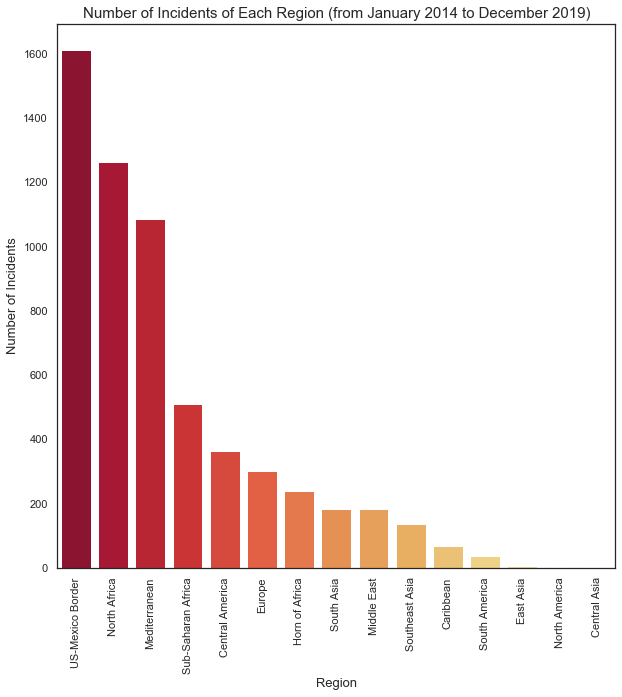

In [28]:
#bar graph
sns.set(style="white")
plt.figure(figsize=(10,10))
sns.barplot(incidents_reg_count.index, incidents_reg_count.values, palette='YlOrRd_r')
plt.xlabel('Region', fontsize = 13)
plt.xticks(rotation = 90)
plt.ylabel('Number of Incidents', fontsize = 13)
plt.title('Number of Incidents of Each Region (from January 2014 to December 2019)', fontsize = 15)
plt.show()

The US-Mexico Border experienced the greatest number of incidents in the given period, followed by North Africa, and the Mediterranean. These three regions far outstrip the other regions in the frequency of incidents. Central Asia experienced the least amount of incidents. 

A follow up question:
<font size = 3>**How did the frequency of incidents in each of the top three regions change over the time period (in years)?**</font>

In [29]:
#sort main data set in ascending order with regards to time and store in time_ordered_mmdata
time_ordered_mmdata = mm_data.sort_values(by='Reported Date', ascending=True)

In [30]:
#extracting portion of dataset for regions US-Mexico Border, North Africa, and the Mediterranean
top_regions_data = time_ordered_mmdata[(time_ordered_mmdata['Region of Incident'] == 'US-Mexico Border') | 
                                       (time_ordered_mmdata['Region of Incident'] == 'North Africa') | 
                                       (time_ordered_mmdata['Region of Incident'] == 'Mediterranean')]

In [31]:
#add column of ones called 'Number of Incidents' to top_regions_data to be able to count
top_regions_data.loc[:,'Number of Incidents'] = 1

C:\Users\Freev\Anaconda3\lib\site-packages\pandas\core\indexing.py:376: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\Freev\Anaconda3\lib\site-packages\pandas\core\indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [32]:
#grouping by year and region and counting number of incidents
region_year_group = top_regions_data.pivot_table(index=['Region of Incident','Reported Year'], values='Number of Incidents', aggfunc='count')
region_year_group

Number of Incidents
Region of Incident Reported Year                     
Mediterranean      2014                            65
                   2015                           211
                   2016                           216
                   2017                           243
                   2018                           204
                   2019                           146
North Africa       2014                             8
                   2015                           209
                   2016                           411
                   2017                           288
                   2018                           318
                   2019                            28
US-Mexico Border   2014                           109
                   2015                           192
                   2016                           285
                   2017                           318
                   2018                           378
                   2019                           330

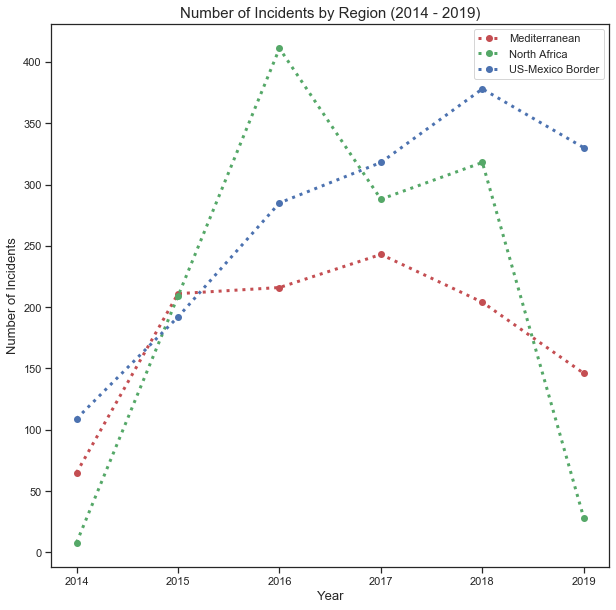

In [33]:
#plotting as line graphs
sns.set(style = 'ticks' )

med = region_year_group.loc['Mediterranean']
n_a = region_year_group.loc['North Africa']
us_m =region_year_group.loc['US-Mexico Border']

plt.figure(figsize=(10,10))

plt.plot(med['Number of Incidents'], 'r:' ,label ='Mediterranean', marker = 'o', markersize = 5, mew = 2, linewidth = 3)
plt.plot(n_a['Number of Incidents'], 'g:' ,label ='North Africa', marker = 'o', markersize = 5, mew = 2, linewidth = 3)
plt.plot(us_m['Number of Incidents'], 'b:', label ='US-Mexico Border', marker = 'o', markersize = 5, mew = 2, linewidth = 3)

plt.xlabel('Year', fontsize = 13)
plt.ylabel('Number of Incidents', fontsize = 13)
plt.title('Number of Incidents by Region (2014 - 2019)', fontsize = 15)
plt.legend(loc='upper right')

plt.show()


The North African region saw a increase in migrant incidents from 2014 and which peaked in 2016 when over 400 incidents where asyulum seekers perished or went missing. The US-Mexico border shows a steady increase in incident from 2014 to 2018. The incidents in the Mediterranean reached their peak in 2017.  

<font size = 3>**2. What was the biggest cause of death overall and for particular regions?**</font>

In [34]:
#extracting causes of death (some entries have several causes of death)

#import regular expression library
import re

#dict of given causes of death and frequency
#use regular expression to split string and ignore whitespace
dict_type_count = {}
for d in mm_data['Cause of Death'].index:
    list_temp = []
    list_temp.extend(re.split(r'[,]\s*',mm_data['Cause of Death'][d])) 
    for i in list_temp:
        if i not in dict_type_count:
            dict_type_count[i] = 1
        else:
            dict_type_count[i] += 1

#converting dictionary into series
death_type_count = pd.Series(dict_type_count)
print(death_type_count)

Hypothermia                 91
Presumed drowning          389
Unknown                    621
Drowning                  1163
Air strike                   3
                          ... 
Organ failure                1
Fall onto train tracks       1
Pulmonary edema              1
Envenomation                 1
Fall from boat               2
Length: 114, dtype: int64


In [35]:
#combine all values with 'unknown' as one entry with index 'Unknown', and combine any cause of death related to forms of transport  as 'Vehicle Accident' 
dict_repeated = {}
dict_repeated['Unknown'] = 0
dict_repeated['Vehicle Accident'] = 0
reps = pd.Series(death_type_count.index)

list_reps =[]

for i in reps[reps.str.contains(r'[Uu]nknown')]:
    dict_repeated['Unknown'] += death_type_count[i]
    list_reps.append(i)
        
for i in reps[reps.str.contains(r'\b[Tt]ruck\b')]:
    dict_repeated['Vehicle Accident'] += death_type_count[i]
    list_reps.append(i)
    
for i in reps[reps.str.contains(r'[Tt]rain')]:
    if i not in list_reps:
        dict_repeated['Vehicle Accident'] += death_type_count[i]
        list_reps.append(i)
        
for i in reps[reps.str.contains(r'\b[Bb]us\b')]: 
    dict_repeated['Vehicle Accident'] += death_type_count[i]
    list_reps.append(i)

for i in reps[reps.str.contains(r'[Vv]ehicle')]: 
    if i != 'Accident (non-vehicle)':
        dict_repeated['Vehicle Accident'] += death_type_count[i]
        list_reps.append(i)
        
death_type_count.drop(list_reps, inplace=True)
death_type_count = death_type_count.append(pd.Series(dict_repeated))
print('The 10 biggest causes of deaths are: \n{} '.format(death_type_count.sort_values(ascending=False)[:10]))

The 10 biggest causes of deaths are: 
Unknown                                     1189
Drowning                                    1163
Sickness and lack of access to medicines     984
Vehicle Accident                             826
Dehydration                                  427
Presumed drowning                            389
Starvation                                   383
Shot                                         220
Harsh weather/lack of adequate shelter       158
Excessive Physical Abuse                     147
dtype: int64 


We will create a word map to give an idea of what the biggest causes of death are.

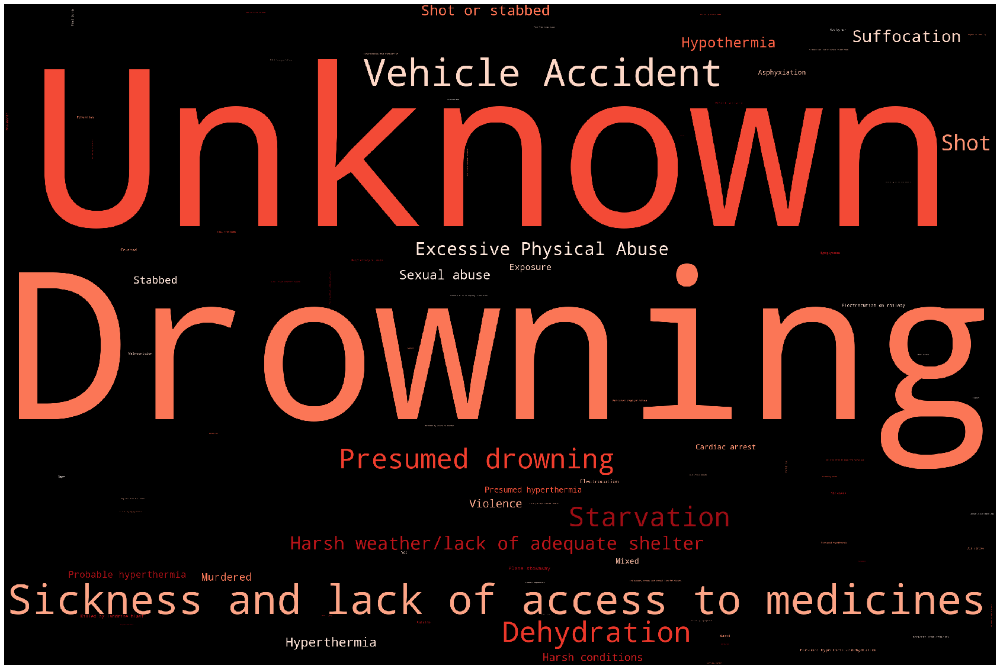

In [36]:
from wordcloud import WordCloud, STOPWORDS


wordcloud = WordCloud(width = 3000, height = 2000 , background_color = 'black', colormap = 'Reds',
                       stopwords = STOPWORDS).generate_from_frequencies(death_type_count.to_dict())

fig = plt.figure(figsize = (30,25))
plt.imshow(wordcloud)
plt.axis('off')

plt.show()


Drowning is the biggest known cause of death. Other common causes of death are sickness, hypothermia, dehydartion, starvation, harsh weather/ lack of adequate shelter, and vehicle accidents. When the causes of death are set out like this, it brings to the fore the reality of the asylum seekers' lives. Nobody willingly leaves relative safety to go out into the unknown unless there was a powerful push factor. 

<font size = 3>**3. Are there any seasonal patterns in the number of incidents?**</font>

In [37]:
mm_copy = mm_data.copy()
mm_copy.loc[:, 'Number of Incidents'] = 1
mm_copy.head()

,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,...,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality,Marker Label,Number of Incidents
0,52673,Mediterranean,2019-12-30,2019,Dec,1.0,0.0,1,11.0,NaN,...,Hypothermia,Unspecififed location off the coast of Algeria,El Watan,"35.568972356329, -1.289773129748",Western Mediterranean,https://bit.ly/2FqQHo4,Uncategorized,1,Location: Unspecififed location off the coast ...,1
1,52666,Mediterranean,2019-12-30,2019,Dec,1.0,0.0,1,NaN,NaN,...,Presumed drowning,"Recoverd on Calamorcarro Beach, Ceuta",El Foro de Ceuta,"35.912383552874, -5.357673338898",Western Mediterranean,https://bit.ly/39yKRyF,Uncategorized,1,"Location: Recoverd on Calamorcarro Beach, Ceut...",1
2,52663,East Asia,2019-12-27,2019,Dec,5.0,0.0,5,NaN,NaN,...,Unknown,"Bodies found on boat near Sado Island, Niigata...","Japan Times, Kyodo News, AFP","38.154018233313, 138.086032653130",NaN,"http://bit.ly/2sCnBz1, http://bit.ly/2sEra83, ...",Eastern Asia,3,Location: Bodies found on boat near Sado Islan...,1
3,52662,Middle East,2019-12-26,2019,Dec,7.0,0.0,7,64.0,NaN,...,Drowning,"Van lake near Adilcevaz, Bitlis, Turkey","EFE, BBC, ARYnews","38.777228612085, 42.739257582031",NaN,"http://bit.ly/2ZG2Y19, http://bit.ly/2MLamDf, ...",Western Asia,3,"Location: Van lake near Adilcevaz, Bitlis, Tur...",1
4,52661,Middle East,2019-12-24,2019,Dec,12.0,0.0,12,NaN,NaN,...,Air strike,"Al-Raqw market in Saada, Yemen","UN Humanitarian Coordinator in Yemen, Qatar Tr...","17.245364805636, 43.239093360326",NaN,"http://bit.ly/2FjolvD, http://bit.ly/2sD42GR, ...",Western Asia,4,"Location: Al-Raqw market in Saada, Yemen; Date...",1


In [38]:
season_pattern = mm_copy.pivot_table(index='Reported Month', values='Number of Incidents', aggfunc='sum') 
season_pattern.reset_index(inplace=True)
#season_pattern

In [39]:
dict_months = {'Jan':1, 'Feb':2, 'Mar':3, 'Apr':4, 'May':5, 'Jun':6, 'Jul':7, 'Aug':8, 'Sep':9, 'Oct':10, 'Nov':11, 'Dec':12}
season_pattern['Reported Month'] = season_pattern['Reported Month'].map(dict_months)

In [40]:
season_pattern.sort_values(by='Reported Month', inplace=True)
#check
#season_pattern

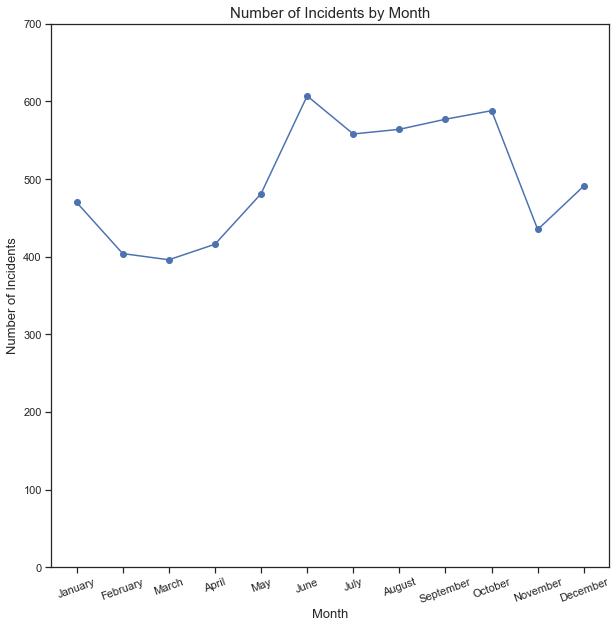

In [41]:
#plotting number of incidents by month
import calendar
plt.figure(figsize=(10,10))

plt.plot(season_pattern['Reported Month'], season_pattern['Number of Incidents'], 'b-', marker = 'o')
plt.ylim(0, 700)
plt.xlabel('Month',fontsize = 13)
plt.xticks(np.arange(1,13), calendar.month_name[1:13], rotation=20)
plt.ylabel('Number of Incidents', fontsize = 13)
plt.title('Number of Incidents by Month', fontsize = 15)
plt.show()

On average over the years covered in the dataset, the number of incidents increase during the Northern Hemisphere's warmer months. Warmer months could bring favourable weather to attempt sea crossings, and also longer days (more sunlight) to travel.